<a href="https://colab.research.google.com/github/zavavan/case-2021-shared-task/blob/main/Evaluation_Pipeline_Task_2_CASE2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Setup

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

from IPython.display import clear_output
!pip install argparse
!pip install xtract
!pip install wget
!pip install -U matplotlib
import time as time
import ipywidgets as widgets
import json
#clear_output()
import gzip
import shutil
import os
import wget
import csv
import linecache
from shutil import copyfile
import numpy as np
import pandas as pd
import datetime
import shapely.speedups

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

!pip install geopandas
!pip install scipy
!pip install shapely
!pip install bokeh
!pip install cartopy
!pip install statsmodels
!pip install sklearn
!pip install osmnx
!pip install folium

import numpy as np
import pandas as pd
import geopandas as gpd
import scipy
import shapely
import matplotlib.pyplot as plt
import bokeh
import cartopy
import statsmodels
import sklearn
import osmnx
import folium
from sklearn.metrics import mean_squared_error

import time

# Where to save the figures
PROJECT_ROOT_DIR = "/content/drive/MyDrive/Colab Notebooks/CASE2022_Task2"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images")

def save_fig(fig_id, tight_layout=False, fig_extension="png", resolution=1200):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached argparse-1.4.0-py2.py3-none-any.whl (23 kB)


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in

In [ ]:
INPUT_DATA_PATH = os.path.join(PROJECT_ROOT_DIR, "SYSTEM_SUBMISSIONS")
os.makedirs(INPUT_DATA_PATH, exist_ok=True)

def load_system_submission(input_data_path,system_name,submission_name,_header):
    csv_path = os.path.join(input_data_path, system_name, submission_name)
    print('loading system submission data from file: ' + csv_path)
    return pd.read_csv(csv_path,header=_header)

#"D:\\knime_workspace\\Event Deduplication Evaluation New\\Data\\CASE2021\\Hu-Tiancheng-ETH\\submission.NoConflict.twitter.1.csv"

## Open Street Map (Nominatim API) location normalization

The String representation of the event location will be automatically converted into a pair of geographical coordinates by using the Nominatim search API (https://nominatim.org/release-docs/develop/api/Search/). While only the country attribute is mandatory, systems are expected to assign a description of the event location at the finest grained level possible, as otherwise geographical coordinate conversion from Nominatim will place the event at the geographical centroid of the polygon of the assigned administrative unit, which may penalize the correlation score on Prio-GRID cell aggregation.
   

In [46]:
!pip install geopy
from geopy.geocoders import Nominatim

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [47]:
geolocator = Nominatim(user_agent="case2022_task2",timeout=30)

In [ ]:
def make_structured_query(x, y, z):
    return {"city":x, "state":y, "country":z}

### System Output File

In [ ]:
system_output = load_system_submission("/content/drive/MyDrive/Colab Notebooks/CASE2022_Task2","classbases","submission.classbases.news.1.csv",None)
system_output.columns =['id','city', 'state', 'country', 'date']
system_output.tail()

In [ ]:
so_locations = system_output[['city','state','country']].value_counts(ascending=False).reset_index(name='count')[['city','state','country']]

In [ ]:
so_results = [geolocator.geocode(make_structured_query(x,y,z)) if geolocator.geocode(make_structured_query(x,y,z)) is not None else geolocator.geocode(x + "," + y + "," + z)  for x, y, z in so_locations[['city','state','country']].to_numpy()]


In [ ]:
so_locations['lat'] = [result.latitude if result is not None else 'NaN' for result in so_results]
so_locations['lon'] = [result.longitude if result is not None else 'NaN' for result in so_results]

In [ ]:
so_locations.to_csv("/content/drive/MyDrive/Colab Notebooks/CASE2022_Task2/classbases/OSMNormalizedLocations.submission.classbases.news.1.csv",index=False)

In [ ]:
system_output['lat'] = [ so_locations.loc[(so_locations['city'] == x) & (so_locations['state'] == y) & (so_locations['country'] == z), 'lat'].iloc[0]  for x,y,z in system_output[['city','state','country']].to_numpy()]
system_output['lon'] = [ so_locations.loc[(so_locations['city'] == x) & (so_locations['state'] == y) & (so_locations['country'] == z), 'lon'].iloc[0]  for x,y,z in system_output[['city','state','country']].to_numpy()]

In [ ]:
system_output.to_csv("/content/drive/MyDrive/Colab Notebooks/CASE2022_Task2/classbases/submission.classbases.news.1.OSMNormalized.csv",index=False)

In [ ]:
len(system_output)

### Gold Standard File

In [ ]:
gs = load_system_submission("/content/drive/MyDrive/Colab Notebooks","GoldStandard","covid_protests_riots_us.csv",0)
#df.columns =['id','city', 'state', 'country', 'date','url']


In [ ]:
len(gs)

In [ ]:
gs.head()

In [ ]:
locations_gs = gs[['LOCATION','ADMIN1','COUNTRY']].value_counts(ascending=False).reset_index(name='count')[['LOCATION','ADMIN1','COUNTRY']]

In [ ]:
# Iterating over two columns, use `zip`
results_gs = [geolocator.geocode(make_structured_query(x,y,z)) if geolocator.geocode(make_structured_query(x,y,z)) is not None else geolocator.geocode(x + "," + y + "," + z) for x, y, z in locations_gs[['LOCATION','ADMIN1','COUNTRY']].to_numpy()]


In [ ]:
locations_gs['lat'] = [result.latitude if result is not None else 'NaN' for result in results_gs]
locations_gs['lon'] = [result.longitude if result is not None else 'NaN' for result in results_gs]

In [ ]:
locations_gs.to_csv("/content/drive/MyDrive/Colab Notebooks/GoldStandard/OSMNormalizedLocations.csv",index=False)

In [ ]:
gs['lat'] = [ locations_gs.loc[(locations_gs['LOCATION'] == x) & (locations_gs['ADMIN1'] == y) & (locations_gs['COUNTRY'] == z), 'lat'].iloc[0]  for x,y,z in gs[['LOCATION','ADMIN1','COUNTRY']].to_numpy()]
gs['lon'] = [ locations_gs.loc[(locations_gs['LOCATION'] == x) & (locations_gs['ADMIN1'] == y) & (locations_gs['COUNTRY'] == z), 'lon'].iloc[0]  for x,y,z in gs[['LOCATION','ADMIN1','COUNTRY']].to_numpy()]

In [ ]:
gs.head(3)

In [ ]:
gs.to_csv("/content/drive/MyDrive/Colab Notebooks/GoldStandard/covid_protests_riots_us.OSMNormalized.csv",index=False)

## PRIO-GRID normalization

We join event point shapefiles with a PRIO-GRID shapefile. PRIO-GRID is a vector grid network with a resolution of 0.5 x 0.5 decimal degrees (~55 km), covering all terrestrial areas of the world.
The following code is the equivalent of the following QGIS procedure:
Menu > Vector > Data Management Tools > Join attributes by location 
Target : points layer, Join layer: polygons layer. That way info from your districts goes into your points Geometric predicate : Check ON all the options: intersects, touches etc. I haven't looked further into this yet but just one option had not worked out earlier.
Attributes summary : Take attributes of first located feature Joined table : 
Keep all records ... that will preserve the points that were outside of all the wards too

### Loading the PRIOGrid shape file

In [51]:
tic = time.time()
fp = "/content/drive/MyDrive/Colab Notebooks/CASE2022_Task2/priogrid_shapefiles/priogrid_cell.shp"

# Read the data
priogrid = gpd.read_file(fp)
priogrid.set_crs("EPSG:4326")
toc = time.time()
print('time to read the priogrid shape file = ' + str((toc - tic)/60) + ' minutes' )

selected_cols = ['gid', 'geometry']
priogrid = priogrid[selected_cols]

time to read the priogrid shape file = 0.5905713160832723 minutes


### Loading the US country shape file



In [ ]:
tic = time.time()
fp = "/content/drive/MyDrive/Colab Notebooks/CASE2022_Task2/gadm36_USA_shp/gadm36_USA_0.shp"
usa = gpd.read_file(fp)
toc = time.time()
print('time to read the US shape file = ' + str((toc - tic)/60) + ' minutes' )

usa.info()

### Intersection of PRIOGrid with the US country shape file

In [ ]:
shapely.speedups.enable()
# enable shapely.speedups which makes queries running faster.

tic = time.time()
priogrid_mask = pd.Series()

priogrid_mask = priogrid['geometry'].intersects(usa.loc[0, 'geometry'])
priogrid_mask.to_frame().to_csv("/content/drive/MyDrive/Colab Notebooks/CASE2022_Task2/priogrid_shapefiles/priogrid_mask.csv",index=False)
# selecting the polygon's geometry field to filter out points that are not overlaid
toc = time.time()
print('time to execute the intersection with USA shape file = ' + str((toc - tic)/60) + ' minutes' )




In [ ]:
priogrid_usa = priogrid.loc[priogrid_mask]

In [ ]:
priogrid_usa.to_csv("/content/drive/MyDrive/Colab Notebooks/CASE2022_Task2/priogrid_shapefiles/priogrid_usa.csv",index=False)


### Gold Standard File
###### reading the OSM-normalized Gold Standard from file:

In [97]:
gsOSMNormalized = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/GoldStandard/covid_protests_riots_us.OSMNormalized.csv",header=0)

gsOSMNormalized=gsOSMNormalized.dropna(subset=['lon'])
gsOSMNormalized=gsOSMNormalized.dropna(subset=['lat'])


gs_gdf = gpd.GeoDataFrame(
    gsOSMNormalized, geometry=gpd.points_from_xy(gsOSMNormalized.lon, gsOSMNormalized.lat))
gs_gdf = gs_gdf.set_crs("EPSG:4326")


In [78]:
gsOSMNormalized.head(2)

,ISO,EVENT_ID_CNTY,EVENT_ID_NO_CNTY,EVENT_DATE,YEAR,TIME_PRECISION,EVENT_TYPE,SUB_EVENT_TYPE,ACTOR1,ASSOC_ACTOR_1,...,LONGITUDE,GEO_PRECISION,SOURCE,SOURCE_SCALE,NOTES,FATALITIES,TIMESTAMP,lat,lon,geometry
0,840,USA22501,22501,2020-02-13,2020,1,Protests,Peaceful protest,Protesters (United States),NNU: National Nurses United; Health Workers (U...,...,-118.154,1,California Nurses Association,Other,"On 13 February 2020, a group of nurses of the ...",0,1612546516,34.698106,-118.136615,POINT (-118.13662 34.69811)
1,840,USA22742,22742,2020-02-23,2020,1,Protests,Peaceful protest,Protesters (United States),NNU: National Nurses United; Health Workers (U...,...,-117.853,1,California Nurses Association,Other,"On 23 February 2020, a group of nurses with Ca...",0,1612546517,33.787257,-117.850308,POINT (-117.85031 33.78726)


###### joining it with US subset of PRIOGrid cells:

In [ ]:
tic = time.time()

# Make a spatial join
join = gs_gdf.sjoin(priogrid_usa, how="inner", op="within")
toc = time.time()
print('time to execute the sjoin with PRIOGrid shape file = ' + str((toc - tic)/60) + 'minutes' )
join.columns
selected_cols1 = ['EVENT_ID_NO_CNTY','LOCATION','ADMIN1','COUNTRY','EVENT_DATE','lat','lon','geometry','gid']
join = join[selected_cols1]
dict = {'EVENT_ID_NO_CNTY': 'id',
        'LOCATION': 'city',
        'ADMIN1': 'state',
        'COUNTRY': 'country',
        'EVENT_DATE': 'date' }
 
# call rename () method
join.rename(columns=dict,inplace=True)
join.to_csv("/content/drive/MyDrive/Colab Notebooks/GoldStandard/covid_protests_riots_us.OSMNormalized.PrioAggregated.csv",index=False)

### Intersection with the US country shape file

In [ ]:
gsPrioAggregated = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/GoldStandard/covid_protests_riots_us.OSMNormalized.PrioAggregated.csv",header=0)
gsPrioAggregated_gdf = gpd.GeoDataFrame(
    gsPrioAggregated, geometry=gpd.points_from_xy(gsPrioAggregated.lon, gsPrioAggregated.lat))
gsPrioAggregated_gdf = gsPrioAggregated_gdf.set_crs("EPSG:4326")

In [ ]:
import shapely.speedups

shapely.speedups.enable() 
# enable shapely.speedups which makes queries running faster.

tic = time.time()
gs_us_mask = gsPrioAggregated_gdf['geometry'].within(usa.loc[0, 'geometry'])
# selecting the polygon's geometry field to filter out points that are not overlaid
toc = time.time()
print('time to execute the intersection with USA shape file = ' + str((toc - tic)/60) + ' minutes' )

gs_us_PrioAggregated = gsPrioAggregated.loc[gs_us_mask]
gs_us_mask.to_frame().to_csv("/content/drive/MyDrive/Colab Notebooks/GoldStandard/priogrid_mask.csv",index=False)
gs_us_PrioAggregated.to_csv("/content/drive/MyDrive/Colab Notebooks/GoldStandard/covid_protests_riots_us.OSMNormalized.PrioAggregated.csv",index=False)


### System Output File

In [98]:
system_output = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/CASE2022_Task2/classbases/submission.classbases.news.1.OSMNormalized.csv",header=0)
system_output=system_output.dropna(subset=['lon'])
system_output=system_output.dropna(subset=['lat'])

In [99]:
system_output_gdf = gpd.GeoDataFrame(
    system_output, geometry=gpd.points_from_xy(system_output.lon, system_output.lat))
system_output_gdf = system_output_gdf.set_crs("EPSG:4326")

In [73]:
# Make a spatial join
tic = time.time()
join1 = system_output_gdf.sjoin(priogrid, how="inner", op="within")
toc = time.time()
print('time to execute the sjoin with PRIOGrid shape file = ' + str((toc - tic)/60) + ' minutes' )
join1.head(5)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


time to execute the sjoin with PRIOGrid shape file = 0.6285556793212891 minutes


,id,city,state,country,date,lat,lon,geometry,index_right,gid
0,138,Washington,DC,United States,2020-07-27,38.895037,-77.036543,POINT (-77.03654 38.89504),74003,185246
2,224,Washington,DC,United States,2020-07-27,38.895037,-77.036543,POINT (-77.03654 38.89504),74003,185246
50,4587,Washington,DC,United States,2020-07-29,38.895037,-77.036543,POINT (-77.03654 38.89504),74003,185246
53,4902,Washington,DC,United States,2020-07-29,38.895037,-77.036543,POINT (-77.03654 38.89504),74003,185246
90,9770,Washington,DC,United States,2020-07-31,38.895037,-77.036543,POINT (-77.03654 38.89504),74003,185246


In [120]:
shapely.speedups.enable() 
# enable shapely.speedups which makes queries running faster.

tic = time.time()
gs_mask1 = join1['geometry'].within(usa.loc[0, 'geometry']) 
# selecting the polygon's geometry field to filter out points that 
# are not overlaid
toc = time.time()
print('time to execute the intersection with USA shape file = ' + str((toc - tic)/60) + ' minutes' )

system_output = join1.loc[gs_mask1]
print(len(system_output))
system_output.to_csv("/content/drive/MyDrive/Colab Notebooks/CASE2022_Task2/classbases/submission.classbases.news.1.OSMNormalized_PRIO_Aggregated.csv",index=False)

time to execute the intersection with USA shape file = 31.156644101937612 minutes
672


In [104]:
len(system_output)

1268

### VISUALIZING GOLD STANDARD AND SYSTEM OUTPUT EVENTS ON MAPS

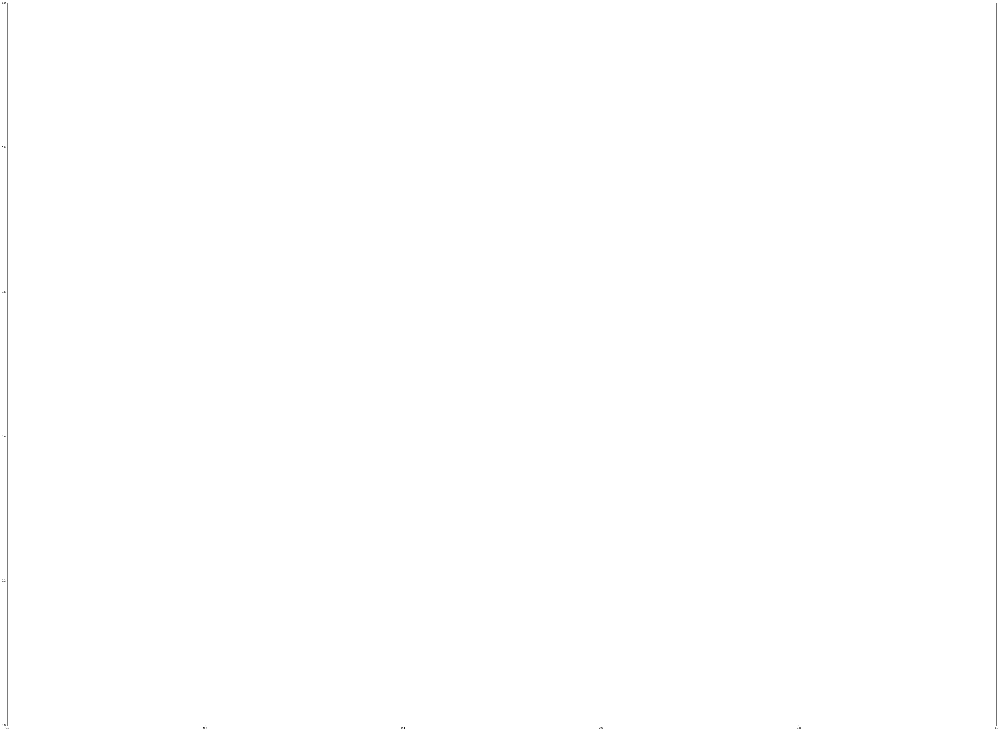

In [119]:
# We restrict to US.

fig, ax = plt.subplots(figsize=(80,60))
map = folium.Map(location = [40.000,-95.000], tiles='OpenStreetMap' , zoom_start = 4)

# mark each SO event as a red point
for index, row in system_output.iterrows():
        folium.CircleMarker([row['lat'], row['lon']], radius=2,popup=row['id'],fill_color='green').add_to(map)



# mark each GS event as a blue point
for index, row in gs_gdf.iterrows():
    folium.CircleMarker([row['lat'], row['lon']],radius=2,popup=row['EVENT_ID_NO_CNTY'],fill_color='blue').add_to(map)



map.save(os.path.join(IMAGES_PATH, "MapVisualizationGS_and_SOs.htm"))

map



### Column filtering

In [24]:
system_output = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/CASE2022_Task2/classbases/submission.classbases.news.1.OSMNormalized_PRIO_Aggregated.csv",header=0)
system_output = system_output[['id', 'city', 'state', 'country','date', 'lat','lon','gid']]

In [26]:
gs_us_PrioAggregated = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/GoldStandard/covid_protests_riots_us.OSMNormalized.PrioAggregated.csv",header=0)
gs_us_PrioAggregated.columns
gs_us_PrioAggregated = gs_us_PrioAggregated[['id', 'city', 'state', 'country','date','lat','lon','gid']]

### Date column type conversion and filtering by date

In [27]:
gs_us_PrioAggregated['date'] = pd.to_datetime(gs_us_PrioAggregated['date'], errors='raise')

In [28]:
gs_us_PrioAggregated = gs_us_PrioAggregated[(gs_us_PrioAggregated['date'] >= '27-7-2020') & (gs_us_PrioAggregated['date'] <= '26-10-2020')]

In [29]:
len(gs_us_PrioAggregated)

1449

In [30]:
system_output['date'] = pd.to_datetime(system_output['date'], errors='raise')

In [31]:
system_output = system_output[(system_output['date'] >= '27-7-2020') & (system_output['date'] <= '26-10-2020')]

In [32]:
len(system_output)

672

In [33]:
#group_by_gid = gs_events_usa.groupby('gid').size().reset_index(name='count').sort_values(['count'], ascending=False)
#group_by_gid

In [34]:
#events_usa_group_by_gid = events_usa.groupby('gid').size().reset_index(name='count').sort_values(['count'], ascending=False)

### Time shift (2 days) for news data

In [35]:
system_output['date'] = [ x + datetime.timedelta(days=2) for x in system_output['date']  ]


### Sorting by date




In [ ]:
gs_us_PrioAggregated.sort_values(by="date")
system_output.sort_values(by="date")

## METRICS 1: Timeseries of daily "protest cells"

In [ ]:
time_series_gs_events_usa = pd.DataFrame(columns=['Day','ProtestCells'])

time_series_gs_events_usa.Day = [  group[0] for group in gs_us_PrioAggregated.groupby(gs_us_PrioAggregated['date']) ]
time_series_gs_events_usa.ProtestCells = [   group[1]['gid'].nunique() for group in gs_us_PrioAggregated.groupby(gs_us_PrioAggregated['date']) ]

time_series_gs_events_usa.head(10)

In [ ]:
time_series_events_usa = pd.DataFrame(columns=['Day','ProtestCells'])

time_series_events_usa.Day = [  group[0] for group in system_output.groupby(system_output['date']) ]
time_series_events_usa.ProtestCells = [   group[1]['gid'].nunique() for group in system_output.groupby(system_output['date']) ]

time_series_events_usa.head(10)


In [39]:
joined_data_frame1 = (pd.merge(time_series_gs_events_usa, time_series_events_usa, on='Day', how='outer')
        .fillna(0)
        .sort_values('Day')
        .set_index('Day'))

In [125]:
joined_data_frame1.rename(columns={"ProtestCells_x":"GoldStandard","ProtestCells_y":"classbases_news_1"}, inplace=True)

In [126]:
joined_data_frame1.to_csv("/content/drive/MyDrive/Colab Notebooks/CASE2022_Task2/results/metrics1.classbases.news.1.csv",index=False)

In [127]:
joined_data_frame1.columns

Index(['GoldStandard', 'classbases_news_1'], dtype='object')

<Figure size 7800x4200 with 0 Axes>

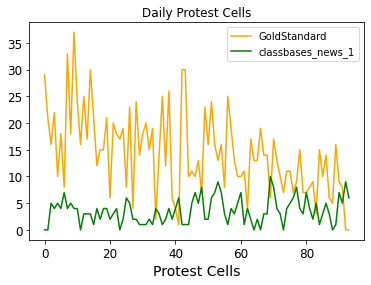

In [129]:
table = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/CASE2022_Task2/results/metrics1.classbases.news.1.csv",header=0)


# to set the plot size
plt.figure(figsize=(26, 14), dpi=300)

# using .plot method
# passing colors as a list
table.plot(label='joined_data_frame1', color=['orange', 'green'])

# adding title
plt.title('Daily Protest Cells')

# adding label to x-axis
plt.xlabel('Day')

# adding label to y-axis
plt.xlabel('Protest Cells')

# adding legend.
plt.legend()


### Scores

In [44]:
joined_data_frame1.GoldStandard.corr(joined_data_frame1.classbases_news_1, method="pearson")

-0.33247589062527

In [45]:
joined_data_frame1.GoldStandard.corr(joined_data_frame1.classbases_news_1, method="spearman")

-0.3344576862751095

In [122]:
mean_squared_error(joined_data_frame1.GoldStandard, joined_data_frame1.classbases_news_1, squared=True)

193.22340425531914

## METRICS 2: Event count correlation on "day_cells":

## Iterate on days: join with PrioGrid_USA

In [130]:
time_series_gs_events_usa = pd.DataFrame()

for group in gs_us_PrioAggregated.groupby(gs_us_PrioAggregated['date']):
   outer_join = pd.merge(group[1].groupby('gid').size().reset_index(name='countID'), priogrid_usa['gid'],how="outer",on="gid").fillna(0)
   outer_join.insert(0, 'Day', group[0])
   time_series_gs_events_usa = time_series_gs_events_usa.append(outer_join)
   


In [132]:
time_series_events_usa = pd.DataFrame()

for group in system_output.groupby(system_output['date']):
   outer_join1 = pd.merge(group[1].groupby('gid').size().reset_index(name='countID'), priogrid_usa['gid'],how="outer",on="gid").fillna(0)
   outer_join1.insert(0, 'Day', group[0])
   time_series_events_usa = time_series_events_usa.append(outer_join1)
   


### Combining columns to create day_cell units:

In [133]:
time_series_gs_events_usa['DayCell'] = time_series_gs_events_usa['Day'].astype(str) +"_"+ time_series_gs_events_usa["gid"].astype(str)


In [134]:
time_series_events_usa['DayCell'] = time_series_events_usa['Day'].astype(str) +"_"+ time_series_events_usa["gid"].astype(str)


In [142]:
time_series_events_usa['Day'] = pd.to_datetime(time_series_events_usa['Day'], errors='raise')

In [143]:
time_series_gs_events_usa.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 470212 entries, 0 to 5110
Data columns (total 4 columns):
 #   Column   Non-Null Count   Dtype         
---  ------   --------------   -----         
 0   Day      470212 non-null  datetime64[ns]
 1   gid      470212 non-null  int64         
 2   countID  470212 non-null  float64       
 3   DayCell  470212 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 17.9+ MB


In [147]:
joined_data_frame2 = (pd.merge(time_series_gs_events_usa, time_series_events_usa, on='DayCell', how='outer')
        .fillna(0))

In [148]:
joined_data_frame2.columns

Index(['Day_x', 'gid_x', 'countID_x', 'DayCell', 'Day_y', 'gid_y',
       'countID_y'],
      dtype='object')

In [149]:
joined_data_frame2.rename(columns={"Day_x":"Day","countID_x":"GoldStandardEvents","countID_y":"SystemOutEvents"}, inplace=True)

In [150]:
joined_data_frame2 = joined_data_frame2[['Day','DayCell','GoldStandardEvents','SystemOutEvents']]
joined_data_frame2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 470212 entries, 0 to 470211
Data columns (total 4 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   Day                 470212 non-null  datetime64[ns]
 1   DayCell             470212 non-null  object        
 2   GoldStandardEvents  470212 non-null  float64       
 3   SystemOutEvents     470212 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(1)
memory usage: 17.9+ MB


In [151]:
joined_data_frame2.to_csv("/content/drive/MyDrive/Colab Notebooks/CASE2022_Task2/results/metrics2.classbases.news.1.join.csv",index=False)

In [152]:
joined_data_frame2.columns

Index(['Day', 'DayCell', 'GoldStandardEvents', 'SystemOutEvents'], dtype='object')

In [153]:
joined_data_frame2.GoldStandardEvents.corr(joined_data_frame2.SystemOutEvents, method="pearson")

0.0462674424436671

In [154]:
joined_data_frame2.GoldStandardEvents.corr(joined_data_frame2.SystemOutEvents, method="spearman")

0.05946311074915083

In [155]:
mean_squared_error(joined_data_frame2.GoldStandardEvents, joined_data_frame2.SystemOutEvents, squared=True)

0.01017200752001225